<h1 align="center">Mathematical Methods in Engineering - Course Code: 25872</h1>
<h3 align="center">Instructor: Dr. Pilaram</h3>
<h4 align="center">Sharif University of Technology</h4>
<h4 align="center">Computer Assignment 2</h4>

<p align="center">For any questions, please contact <a href="https://t.me/imanf82">Iman Fakury</a>.</p>


# **Problem 1: Regression** ``(20 pt.)``
## 1.1 Linear Regression

---
Follow this steps:

1. Write function `generate_linear_data` that generates  sample points $(x_i, y_i)$ where $$y_i = ax_i + b + \epsilon_i$$ $\epsilon_i$ is an error term (measurement error etc.) added to $y_i$ and is modeled by random variables: $\epsilon_i \stackrel{iid}{\sim} \mathcal{N}(0, 1) $
2. Fit a line using least square method that you learned during the course.
3. Evaluate the accuracy of your fit using `Mean Squared Error (MSE)` and `R² score`.
4. Create a scatter plot of the sample data alongside the fitted line.


Note that you shouldn't use any built-in function form np.linalg library.


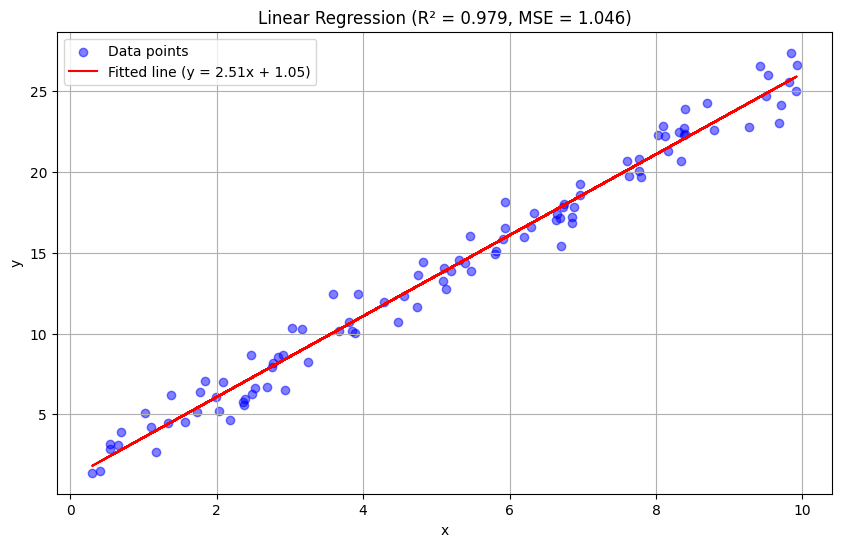

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_linear_data(slope, intercept, num_points=100, noise_std=1.0):
    x = np.random.uniform(0, 10, num_points)
    noise = np.random.normal(0, noise_std, num_points)
    y = slope * x + intercept + noise
    return x, y

def fit_line(x, y):
    n = len(x)
    x_mean = np.mean(x)
    y_mean = np.mean(y)
    numerator = sum((x - x_mean) * (y - y_mean))
    denominator = sum((x - x_mean) ** 2)
    slope = numerator / denominator
    intercept = y_mean - slope * x_mean

    return slope, intercept

def evaluate_fit(y_true, y_pred):
    mse = np.mean((y_true - y_pred) ** 2)
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    r2 = 1 - (ss_res / ss_tot)
    return r2, mse
true_slope = 2.5
true_intercept = 1.0

x, y = generate_linear_data(true_slope, true_intercept)

fitted_slope, fitted_intercept = fit_line(x, y)

y_pred = fitted_slope * x + fitted_intercept

r2, mse = evaluate_fit(y, y_pred)

plt.figure(figsize=(10, 6))
plt.scatter(x, y, color='blue', alpha=0.5, label='Data points')
plt.plot(x, fitted_slope * x + fitted_intercept, color='red', label=f'Fitted line (y = {fitted_slope:.2f}x + {fitted_intercept:.2f})')
plt.xlabel('x')
plt.ylabel('y')
plt.title(f'Linear Regression (R² = {r2:.3f}, MSE = {mse:.3f})')
plt.legend()
plt.grid(True)
plt.show()

## 1.2 Polynomial Regression
Implement all the steps from the previous part in this section.

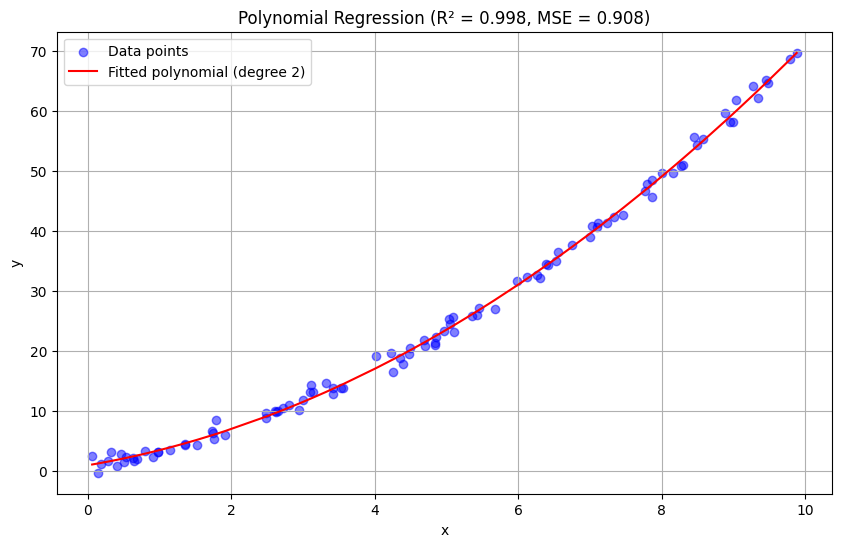

In [ ]:
def generate_polynomial_data(coeffs, num_points=100, noise_std=1.0):
    x = np.random.uniform(0, 10, num_points)

    y = np.zeros(num_points)
    for i, coef in enumerate(coeffs):
        y += coef * (x ** i)

    noise = np.random.normal(0, noise_std, num_points)
    y += noise

    return x, y

def fit_polynomial(x, y, degree):
    X = np.zeros((len(x), degree + 1))
    for i in range(degree + 1):
        X[:, i] = x ** i

    XtX = np.dot(X.T, X)
    Xty = np.dot(X.T, y)

    coeffs = solve_system(XtX, Xty)

    return coeffs

def solve_system(A, b):
    n = len(b)
    x = np.zeros(n)

    for i in range(n):
        pivot = A[i][i]
        for j in range(i + 1, n):
            factor = A[j][i] / pivot
            A[j] = A[j] - factor * A[i]
            b[j] = b[j] - factor * b[i]

    for i in range(n-1, -1, -1):
        x[i] = b[i]
        for j in range(i+1, n):
            x[i] = x[i] - A[i][j] * x[j]
        x[i] = x[i] / A[i][i]

    return x

true_coeffs = [1, 2, 0.5]
degree = len(true_coeffs) - 1

x, y = generate_polynomial_data(true_coeffs)

fitted_coeffs = fit_polynomial(x, y, degree)

x_plot = np.sort(x)
y_pred = np.zeros_like(x_plot)
for i, coef in enumerate(fitted_coeffs):
    y_pred += coef * (x_plot ** i)

r2, mse = evaluate_fit(y, np.polyval(fitted_coeffs[::-1], x))

plt.figure(figsize=(10, 6))
plt.scatter(x, y, color='blue', alpha=0.5, label='Data points')
plt.plot(x_plot, y_pred, color='red',
         label=f'Fitted polynomial (degree {degree})')
plt.xlabel('x')
plt.ylabel('y')
plt.title(f'Polynomial Regression (R² = {r2:.3f}, MSE = {mse:.3f})')
plt.legend()
plt.grid(True)
plt.show()

# **Problem 2: SVD for Compression** ``(30 pt.)``

---

In this question, we want to compress BMP images using SVD. BMP images are not compressed by default and the pixel information is stored in rather a simple format. Colored BMP files are composed of three matrices of size $n × m$ where $n$ and $m$ are the height and width of the image, respectively. Each matrix corresponds to one of the three colors Red, Green, and Blue. Each entry of these matrices is a number between 0 and 255 that specifies the intensity of the corresponding color. The final array is hence a 3D array of size $n × m × 3$.

---

### 2.1 Image display
Choose two arbitrary BMP files (it is recommended to use different subjects and sizes) and load it into a `numpy` array using the `imread` function. Then, show each image and display their shape.

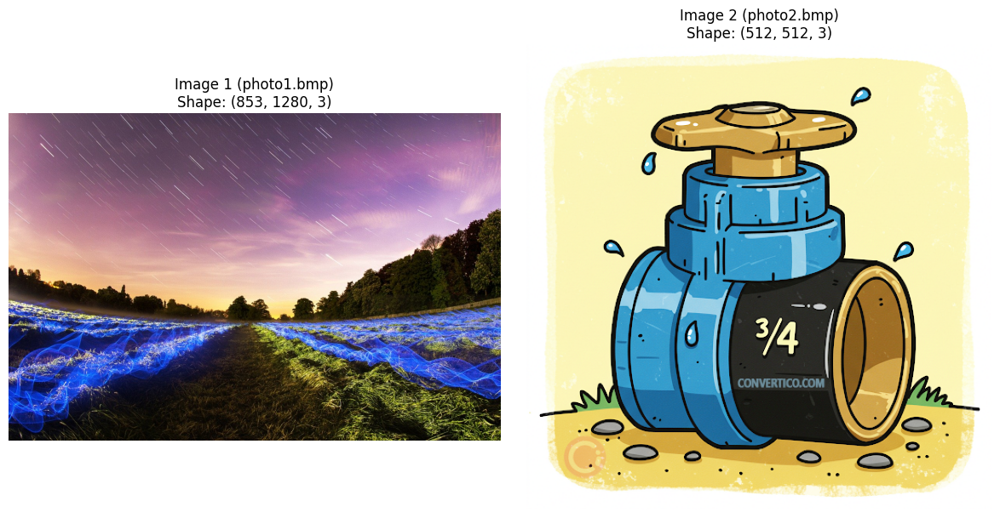

IMAGE INFORMATION
Image 1 (photo1.bmp):
  Shape: (853, 1280, 3)
  Dimensions: 853 × 1280 pixels
  Channels: 3 (RGB)
  Data type: uint8
  Value range: 0 - 255

Image 2 (photo2.bmp):
  Shape: (512, 512, 3)
  Dimensions: 512 × 512 pixels
  Channels: 3 (RGB)
  Data type: uint8
  Value range: 0 - 255


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os

img1 = imread('photo1.bmp')  
img2 = imread('photo2.bmp')  

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title(f'Image 1 (photo1.bmp)\nShape: {img1.shape}')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title(f'Image 2 (photo2.bmp)\nShape: {img2.shape}')
plt.axis('off')

plt.tight_layout()
plt.show()

print("="*50)
print("IMAGE INFORMATION")
print("="*50)
print(f"Image 1 (photo1.bmp):")
print(f"  Shape: {img1.shape}")
print(f"  Dimensions: {img1.shape[0]} × {img1.shape[1]} pixels")
print(f"  Channels: {img1.shape[2]} (RGB)")
print(f"  Data type: {img1.dtype}")
print(f"  Value range: {img1.min()} - {img1.max()}")

print(f"\nImage 2 (photo2.bmp):")
print(f"  Shape: {img2.shape}")
print(f"  Dimensions: {img2.shape[0]} × {img2.shape[1]} pixels")
print(f"  Channels: {img2.shape[2]} (RGB)")
print(f"  Data type: {img2.dtype}")
print(f"  Value range: {img2.min()} - {img2.max()}")

### 2.2 Singular Value Decomposition and channel seperation

Calculate the SVD decomposition of each of ech RGB channel.

$$
A = U \Sigma V^T
$$
where $A$ is the original array, $U$ is an $n × n$ unitary matrix, $\Sigma$ is an $n × m$ rectangular diagonal matrix with non-negative real numbers on the diagonal, and $V$ is an $m × m$ unitary matrix.

SVD DECOMPOSITION FOR IMAGE 1 (photo1.bmp)
Red Channel SVD:
  Original shape: (853, 1280)
  U shape: (853, 853)
  S shape: (853,)
  Vt shape: (853, 1280)
  Number of singular values: 853
  Largest singular value: 130211.80
  Smallest singular value: 52.45

Green Channel SVD:
  Original shape: (853, 1280)
  U shape: (853, 853)
  S shape: (853,)
  Vt shape: (853, 1280)
  Number of singular values: 853
  Largest singular value: 104764.79
  Smallest singular value: 52.18

Blue Channel SVD:
  Original shape: (853, 1280)
  U shape: (853, 853)
  S shape: (853,)
  Vt shape: (853, 1280)
  Number of singular values: 853
  Largest singular value: 124578.24
  Smallest singular value: 53.41


SVD DECOMPOSITION FOR IMAGE 2 (photo2.bmp)
Red Channel SVD:
  Original shape: (512, 512)
  U shape: (512, 512)
  S shape: (512,)
  Vt shape: (512, 512)
  Number of singular values: 512
  Largest singular value: 100381.62
  Smallest singular value: 0.00

Green Channel SVD:
  Original shape: (512, 512)
  U shape

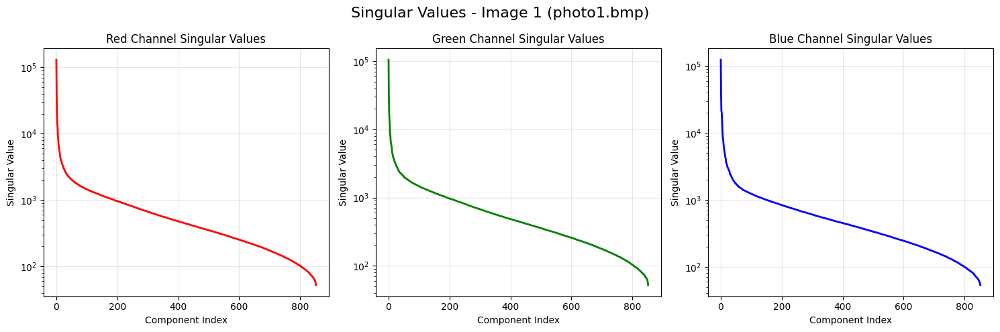

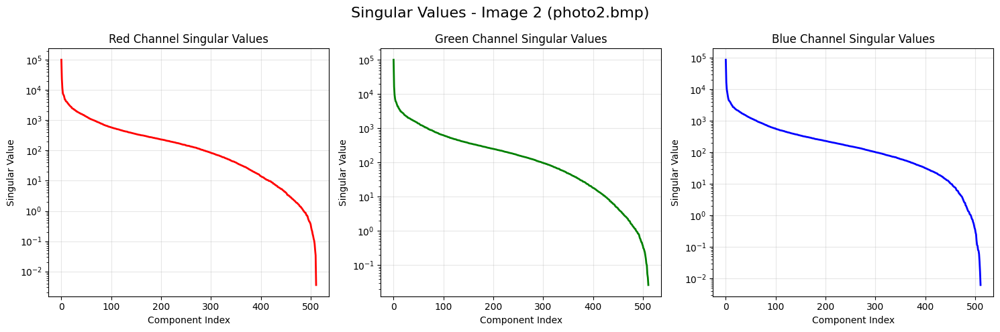


Energy Analysis for Image 1 (photo1.bmp):
----------------------------------------
  Red:   1 components for 50% energy (0.1% of total)
  Red:   2 components for 90% energy (0.2% of total)
  Red:   7 components for 95% energy (0.8% of total)
  Red: 142 components for 99% energy (16.6% of total)

  Green:   1 components for 50% energy (0.1% of total)
  Green:   4 components for 90% energy (0.5% of total)
  Green:  16 components for 95% energy (1.9% of total)
  Green: 198 components for 99% energy (23.2% of total)

  Blue:   1 components for 50% energy (0.1% of total)
  Blue:   3 components for 90% energy (0.4% of total)
  Blue:   7 components for 95% energy (0.8% of total)
  Blue: 115 components for 99% energy (13.5% of total)


Energy Analysis for Image 2 (photo2.bmp):
----------------------------------------
  Red:   1 components for 50% energy (0.2% of total)
  Red:   2 components for 90% energy (0.4% of total)
  Red:   3 components for 95% energy (0.6% of total)
  Red:  31 componen

In [ ]:

def perform_svd_on_image(image):
    
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)

    svd_results = {}
    channels = ['Red', 'Green', 'Blue']

    for i, channel in enumerate(channels):
        
        channel_data = image[:, :, i].astype(np.float64)

        U, S, Vt = np.linalg.svd(channel_data, full_matrices=False)

        svd_results[channel] = {
            'U': U,          
            'S': S,           
            'Vt': Vt,         
            'original': channel_data
        }

        print(f"{channel} Channel SVD:")
        print(f"  Original shape: {channel_data.shape}")
        print(f"  U shape: {U.shape}")
        print(f"  S shape: {S.shape}")
        print(f"  Vt shape: {Vt.shape}")
        print(f"  Number of singular values: {len(S)}")
        print(f"  Largest singular value: {S[0]:.2f}")
        print(f"  Smallest singular value: {S[-1]:.2f}")
        print()

    return svd_results

print("SVD DECOMPOSITION FOR IMAGE 1 (photo1.bmp)")
print("="*60)
svd_img1 = perform_svd_on_image(img1)

print("\nSVD DECOMPOSITION FOR IMAGE 2 (photo2.bmp)")
print("="*60)
svd_img2 = perform_svd_on_image(img2)

def verify_svd_reconstruction(svd_results, image_name):
    
    print(f"\nVerifying SVD reconstruction for {image_name}:")
    print("-" * 50)

    reconstructed_channels = []

    for channel in ['Red', 'Green', 'Blue']:
        U = svd_results[channel]['U']
        S = svd_results[channel]['S']
        Vt = svd_results[channel]['Vt']
        original = svd_results[channel]['original']

        reconstructed = U @ np.diag(S) @ Vt

        error = np.mean(np.abs(original - reconstructed))
        print(f"  {channel} channel reconstruction error: {error:.6f}")

        reconstructed_channels.append(reconstructed)

    reconstructed_image = np.stack(reconstructed_channels, axis=2)
    reconstructed_image = np.clip(reconstructed_image, 0, 255).astype(np.uint8)

    return reconstructed_image

reconstructed_img1 = verify_svd_reconstruction(svd_img1, "Image 1")
reconstructed_img2 = verify_svd_reconstruction(svd_img2, "Image 2")

def plot_singular_values(svd_results, image_name):
    """
    Plot singular values for each RGB channel
    """
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    colors = ['red', 'green', 'blue']

    for i, (channel, color) in enumerate(zip(['Red', 'Green', 'Blue'], colors)):
        S = svd_results[channel]['S']
        axes[i].plot(S, color=color, linewidth=2)
        axes[i].set_title(f'{channel} Channel Singular Values')
        axes[i].set_xlabel('Component Index')
        axes[i].set_ylabel('Singular Value')
        axes[i].grid(True, alpha=0.3)
        axes[i].set_yscale('log')  

    plt.suptitle(f'Singular Values - {image_name}', fontsize=16)
    plt.tight_layout()
    plt.show()

plot_singular_values(svd_img1, "Image 1 (photo1.bmp)")
plot_singular_values(svd_img2, "Image 2 (photo2.bmp)")

def analyze_energy_content(svd_results, image_name):
    
    print(f"\nEnergy Analysis for {image_name}:")
    print("-" * 40)

    for channel in ['Red', 'Green', 'Blue']:
        S = svd_results[channel]['S']

        energy = S**2
        total_energy = np.sum(energy)

        cumulative_energy = np.cumsum(energy) / total_energy * 100

        for threshold in [50, 90, 95, 99]:
            components_needed = np.argmax(cumulative_energy >= threshold) + 1
            compression_ratio = components_needed / len(S) * 100
            print(f"  {channel}: {components_needed:3d} components for {threshold}% energy ({compression_ratio:.1f}% of total)")
        print()

analyze_energy_content(svd_img1, "Image 1 (photo1.bmp)")
analyze_energy_content(svd_img2, "Image 2 (photo2.bmp)")

### 2.3 compressing the image

Since eigenvalues in the decomposition are sorted in descending order, we can approximate the original array by keeping only the first $k$ columns of $U$, first $k$ rows and columns of $\Sigma$, and first $k$ rows of $V^T$.
Select $k$ to be (5, 10, 20, 30, 50, 100, 200, 250) and approximate the original array using the truncated SVD. Show the approximated image titled with the value of $k$.

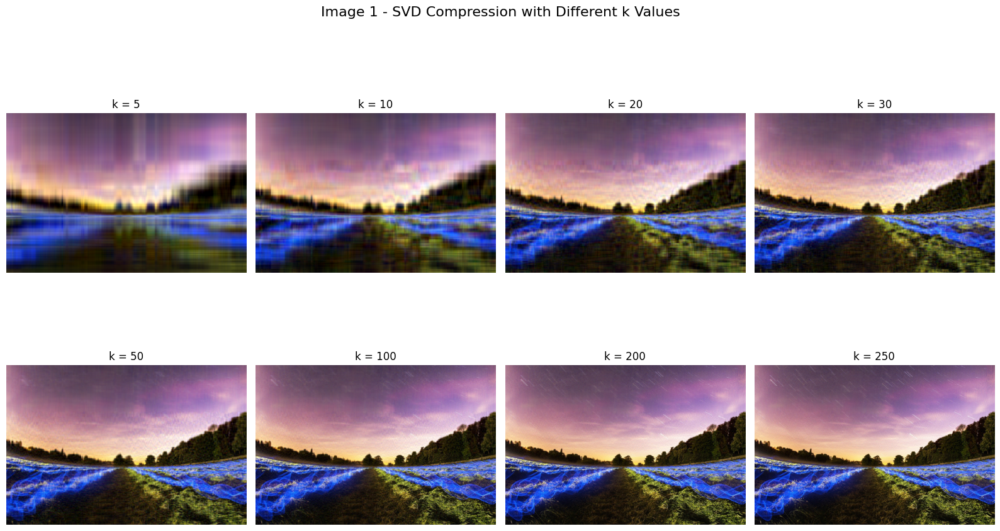

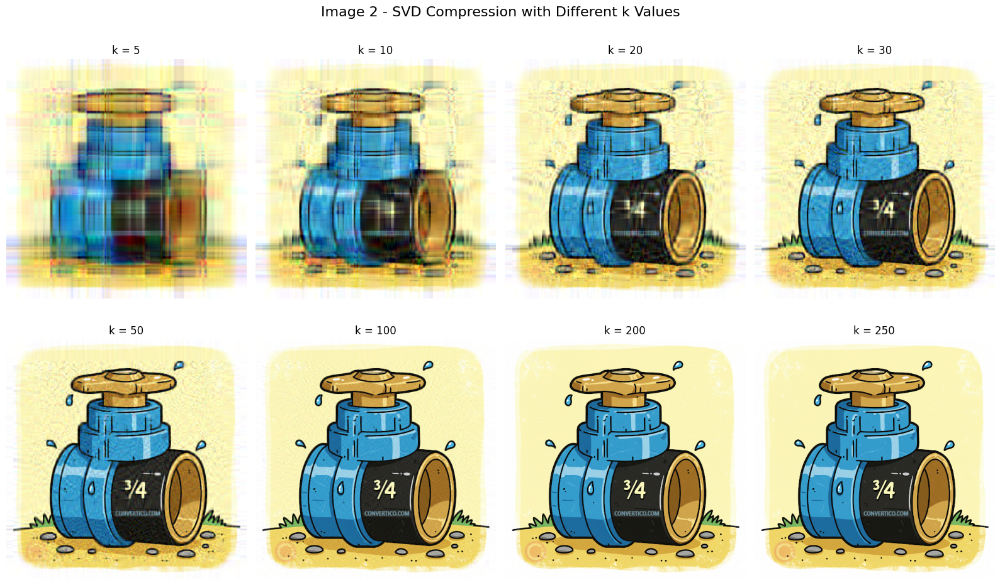

Compression Analysis:
Original image size: (853, 1280, 3)
Original storage requirement: 3275520 values

Compression ratios for different k values:
k =   5: Compressed size =  32010, Compression ratio = 102.33x
k =  10: Compressed size =  64020, Compression ratio = 51.16x
k =  20: Compressed size = 128040, Compression ratio = 25.58x
k =  30: Compressed size = 192060, Compression ratio = 17.05x
k =  50: Compressed size = 320100, Compression ratio = 10.23x
k = 100: Compressed size = 640200, Compression ratio = 5.12x
k = 200: Compressed size = 1280400, Compression ratio = 2.56x
k = 250: Compressed size = 1600500, Compression ratio = 2.05x


In [ ]:
def perform_svd_compression(image, k_values):
    
    red_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 2]

    U_r, s_r, Vt_r = np.linalg.svd(red_channel, full_matrices=False)
    U_g, s_g, Vt_g = np.linalg.svd(green_channel, full_matrices=False)
    U_b, s_b, Vt_b = np.linalg.svd(blue_channel, full_matrices=False)

    compressed_images = []

    for k in k_values:
        
        U_r_k = U_r[:, :k]
        s_r_k = s_r[:k]
        Vt_r_k = Vt_r[:k, :]
        red_compressed = np.dot(U_r_k, np.dot(np.diag(s_r_k), Vt_r_k))

        U_g_k = U_g[:, :k]
        s_g_k = s_g[:k]
        Vt_g_k = Vt_g[:k, :]
        green_compressed = np.dot(U_g_k, np.dot(np.diag(s_g_k), Vt_g_k))

        U_b_k = U_b[:, :k]
        s_b_k = s_b[:k]
        Vt_b_k = Vt_b[:k, :]
        blue_compressed = np.dot(U_b_k, np.dot(np.diag(s_b_k), Vt_b_k))

        compressed_image = np.stack([red_compressed, green_compressed, blue_compressed], axis=2)
        compressed_image = np.clip(compressed_image, 0, 255).astype(np.uint8)

        compressed_images.append(compressed_image)

    return compressed_images

k_values = [5, 10, 20, 30, 50, 100, 200, 250]

compressed_img1 = perform_svd_compression(img1, k_values)
compressed_img2 = perform_svd_compression(img2, k_values)

plt.figure(figsize=(16, 10))
for i, (k, compressed_img) in enumerate(zip(k_values, compressed_img1)):
    plt.subplot(2, 4, i + 1)
    plt.imshow(compressed_img)
    plt.title(f'k = {k}')
    plt.axis('off')

plt.suptitle('Image 1 - SVD Compression with Different k Values', fontsize=16)
plt.tight_layout()
plt.show()

plt.figure(figsize=(16, 10))
for i, (k, compressed_img) in enumerate(zip(k_values, compressed_img2)):
    plt.subplot(2, 4, i + 1)
    plt.imshow(compressed_img)
    plt.title(f'k = {k}')
    plt.axis('off')

plt.suptitle('Image 2 - SVD Compression with Different k Values', fontsize=16)
plt.tight_layout()
plt.show()

original_size = img1.shape[0] * img1.shape[1] * img1.shape[2]
print("Compression Analysis:")
print(f"Original image size: {img1.shape}")
print(f"Original storage requirement: {original_size} values")
print("\nCompression ratios for different k values:")

for k in k_values:
    
    n, m = img1.shape[0], img1.shape[1]
    compressed_size = 3 * k * (n + 1 + m)
    compression_ratio = original_size / compressed_size
    print(f"k = {k:3d}: Compressed size = {compressed_size:6d}, Compression ratio = {compression_ratio:.2f}x")

#### Explain your results.

Explain the relationship between the number of components and the level of compression in the images. How does the image quality change with increasing values of k?

In [ ]:
from IPython.display import display, HTML

english_explanation = """
<div style="background: #f9f9f9; border-left: 6px solid #4CAF50; padding: 16px; font-family: 'Segoe UI', sans-serif; line-height: 1.6; color: #333;">
  <h3 style="margin-top: 0; color: #2e7d32;">Relationship Between Number of Components and Image Compression Quality</h3>

  <p>
    The number of components <strong>k</strong> in truncated Singular Value Decomposition (SVD) directly controls the
    <strong>level of compression</strong> and the <strong>image quality</strong>:
  </p>

  <ul>
    <li><strong>Low k</strong> (e.g., 5 or 10): High compression, low quality (blurry image).</li>
    <li><strong>Moderate k</strong> (e.g., 30 or 50): Balanced compression and quality.</li>
    <li><strong>High k</strong> (e.g., 100 to 250): Low compression, high quality (close to original).</li>
  </ul>

  <p style="margin-top: 20px; border-top: 1px solid #ccc; padding-top: 10px;">
    <strong>Summary:</strong><br>
    Higher <strong>k</strong> → better quality, less compression.<br>
    Lower <strong>k</strong> → worse quality, more compression.
  </p>
</div>
"""

persian_explanation = """
<div style="direction: rtl; background: #f3f3f3; border-right: 6px solid #2196F3; padding: 16px; font-family: 'IRANSans', 'Tahoma', sans-serif; line-height: 1.8; color: #222;">
  <h3 style="margin-top: 0; color: #1565C0;">رابطه تعداد مؤلفه‌ها با کیفیت و فشرده‌سازی تصویر</h3>

  <p>
    تعداد مؤلفه‌های <strong>k</strong> در تجزیه مقدار منفرد (SVD) تأثیر مستقیمی بر
    <strong>میزان فشرده‌سازی</strong> و <strong>کیفیت تصویر</strong> دارد:
  </p>

  <ul>
    <li><strong>k کوچک</strong> (مثلاً ۵ یا ۱۰): فشرده‌سازی زیاد، کیفیت پایین (تصویر تار).</li>
    <li><strong>k متوسط</strong> (مثلاً ۳۰ یا ۵۰): تعادل بین فشرده‌سازی و کیفیت.</li>
    <li><strong>k بزرگ</strong> (مثلاً ۱۰۰ تا ۲۵۰): فشرده‌سازی کم، کیفیت بالا (نزدیک به تصویر اصلی).</li>
  </ul>

  <p style="margin-top: 20px; border-top: 1px solid #ccc; padding-top: 10px;">
    <strong>خلاصه:</strong><br>
    <strong>k بزرگ‌تر</strong> → کیفیت بهتر، فشرده‌سازی کمتر.<br>
    <strong>k کوچک‌تر</strong> → کیفیت پایین‌تر، فشرده‌سازی بیشتر.
  </p>
</div>
"""

comparison_table = """
<table style="width:100%; border-collapse: collapse; font-family: Arial, sans-serif; margin-top: 20px;">
  <thead>
    <tr style="background-color:#e0e0e0;">
      <th style="border:1px solid #ccc; padding:8px;">k</th>
      <th style="border:1px solid #ccc; padding:8px;">Compression Level</th>
      <th style="border:1px solid #ccc; padding:8px;">Image Quality</th>
    </tr>
  </thead>
  <tbody>
    <tr><td style="border:1px solid #ccc; padding:8px;">5</td><td style="border:1px solid #ccc; padding:8px;">Very High</td><td style="border:1px solid #ccc; padding:8px;">Very Low</td></tr>
    <tr><td style="border:1px solid #ccc; padding:8px;">10</td><td style="border:1px solid #ccc; padding:8px;">High</td><td style="border:1px solid #ccc; padding:8px;">Low</td></tr>
    <tr><td style="border:1px solid #ccc; padding:8px;">30</td><td style="border:1px solid #ccc; padding:8px;">Medium</td><td style="border:1px solid #ccc; padding:8px;">Fair</td></tr>
    <tr><td style="border:1px solid #ccc; padding:8px;">50</td><td style="border:1px solid #ccc; padding:8px;">Medium</td><td style="border:1px solid #ccc; padding:8px;">Good</td></tr>
    <tr><td style="border:1px solid #ccc; padding:8px;">100</td><td style="border:1px solid #ccc; padding:8px;">Low</td><td style="border:1px solid #ccc; padding:8px;">Very Good</td></tr>
    <tr><td style="border:1px solid #ccc; padding:8px;">250</td><td style="border:1px solid #ccc; padding:8px;">Very Low</td><td style="border:1px solid #ccc; padding:8px;">Near Original</td></tr>
  </tbody>
</table>
"""

display(HTML(english_explanation))
display(HTML(persian_explanation))
display(HTML(comparison_table))


k,Compression Level,Image Quality
5,Very High,Very Low
10,High,Low
30,Medium,Fair
50,Medium,Good
100,Low,Very Good
250,Very Low,Near Original


### 2.4 variance

There is no need to store $U$ and $V$ matrices. Instead, we can store $\Sigma$ and two other matrices of size $n × k$ and $m × k$. Using $\Sigma$ display the plots below. To not compress the image based on a given random number k, we are required to do some math & statistics

1. The plot "Component Importance" shows the  amount  of variance each component carries. The first component preserves the highest variance, then the second, and so on.
2. The plot shows the explained variance as a function of numbers, using this technique you can choose how much the image, relative to its original size gets compressed.

Analyzing Image 1:


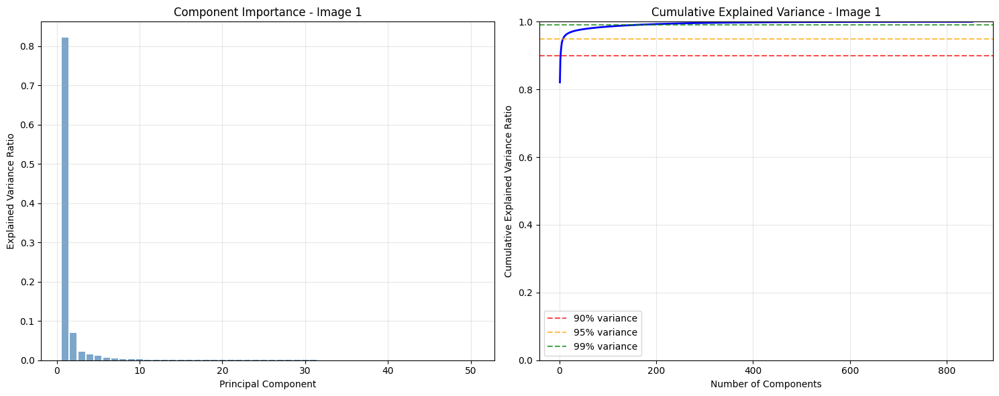


Analyzing Image 2:


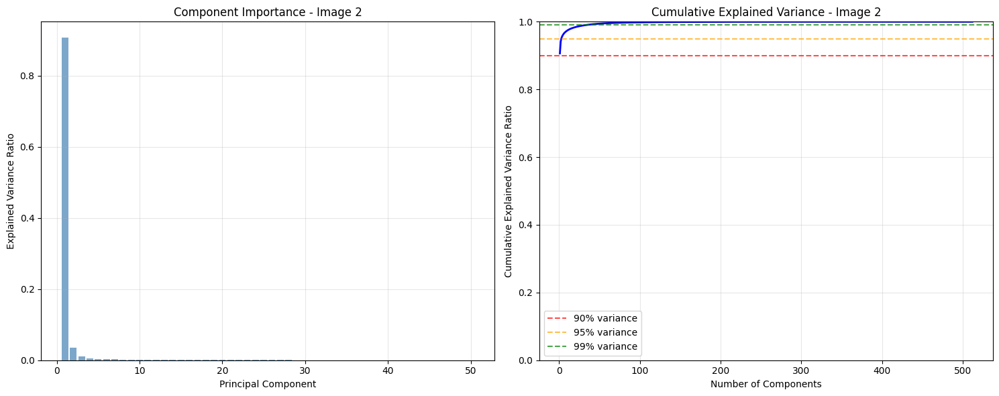


Components needed for 90% variance:
Image 1: 3 components
Image 2: 1 components

Compression ratios (90% variance):
Image 1: 170.55:1
Image 2: 255.75:1


In [ ]:
def compute_svd_for_image(img):
    h, w, c = img.shape
    U_channels = []
    s_channels = []
    Vt_channels = []

    for channel in range(c):
        U, s, Vt = np.linalg.svd(img[:, :, channel], full_matrices=False)
        U_channels.append(U)
        s_channels.append(s)
        Vt_channels.append(Vt)

    return U_channels, s_channels, Vt_channels

def plot_variance_analysis(s_channels, img_name="Image"):
    variances = []
    for s in s_channels:
        variance = s**2
        variances.append(variance)

    avg_variance = np.mean(variances, axis=0)
    total_variance = np.sum(avg_variance)

    explained_variance_ratio = avg_variance / total_variance
    cumulative_variance = np.cumsum(explained_variance_ratio)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    components = range(1, min(51, len(explained_variance_ratio) + 1))  
    ax1.bar(components, explained_variance_ratio[:50], alpha=0.7, color='steelblue')
    ax1.set_xlabel('Principal Component')
    ax1.set_ylabel('Explained Variance Ratio')
    ax1.set_title(f'Component Importance - {img_name}')
    ax1.grid(True, alpha=0.3)

    components_full = range(1, len(cumulative_variance) + 1)
    ax2.plot(components_full, cumulative_variance, 'b-', linewidth=2)
    ax2.axhline(y=0.9, color='r', linestyle='--', alpha=0.7, label='90% variance')
    ax2.axhline(y=0.95, color='orange', linestyle='--', alpha=0.7, label='95% variance')
    ax2.axhline(y=0.99, color='green', linestyle='--', alpha=0.7, label='99% variance')
    ax2.set_xlabel('Number of Components')
    ax2.set_ylabel('Cumulative Explained Variance Ratio')
    ax2.set_title(f'Cumulative Explained Variance - {img_name}')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    ax2.set_ylim(0, 1)

    plt.tight_layout()
    plt.show()

    return explained_variance_ratio, cumulative_variance

def find_components_for_variance(cumulative_variance, target_ratio=0.9):
    """Find number of components needed for target variance ratio"""
    idx = np.argmax(cumulative_variance >= target_ratio)
    return idx + 1

print("Analyzing Image 1:")
U1_channels, s1_channels, Vt1_channels = compute_svd_for_image(img1)
explained_var1, cumulative_var1 = plot_variance_analysis(s1_channels, "Image 1")

print("\nAnalyzing Image 2:")
U2_channels, s2_channels, Vt2_channels = compute_svd_for_image(img2)
explained_var2, cumulative_var2 = plot_variance_analysis(s2_channels, "Image 2")

components_90_img1 = find_components_for_variance(cumulative_var1, 0.9)
components_90_img2 = find_components_for_variance(cumulative_var2, 0.9)

print(f"\nComponents needed for 90% variance:")
print(f"Image 1: {components_90_img1} components")
print(f"Image 2: {components_90_img2} components")

original_size1 = img1.shape[0] * img1.shape[1] * img1.shape[2]
original_size2 = img2.shape[0] * img2.shape[1] * img2.shape[2]

compressed_size1 = components_90_img1 * (img1.shape[0] + img1.shape[1] + 1) * img1.shape[2]
compressed_size2 = components_90_img2 * (img2.shape[0] + img2.shape[1] + 1) * img2.shape[2]

compression_ratio1 = original_size1 / compressed_size1
compression_ratio2 = original_size2 / compressed_size2

print(f"\nCompression ratios (90% variance):")
print(f"Image 1: {compression_ratio1:.2f}:1")
print(f"Image 2: {compression_ratio2:.2f}:1")

Compress the image with 90% of its explained variance ratio and show the result image.

Compressing Image 1 with 90% variance retention:


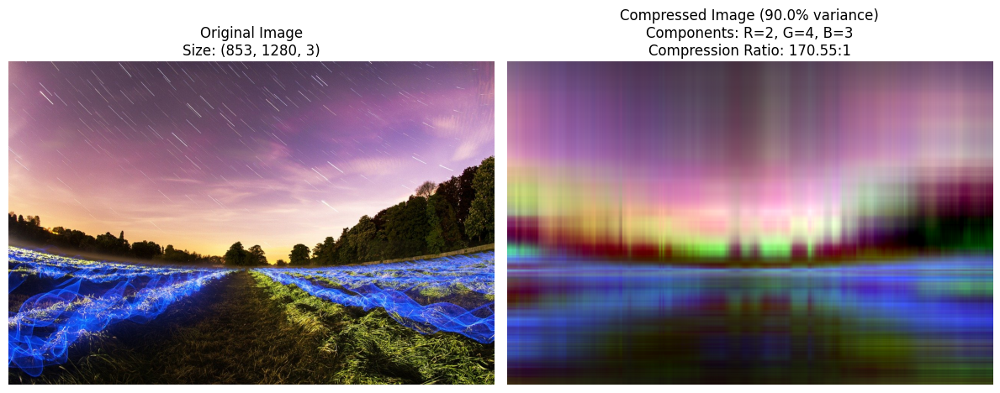

Compression Statistics:
Original image size: 853×1280×3 = 3,275,520 values
Components used - R: 2, G: 4, B: 3
Compressed storage: 19,206 values
Compression ratio: 170.55:1
Storage reduction: 99.4%


Compressing Image 2 with 90% variance retention:


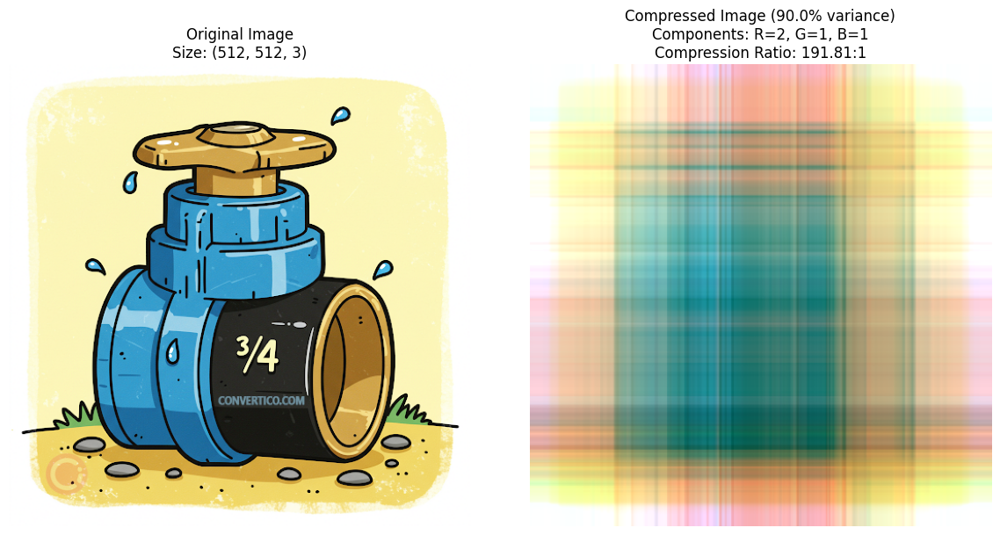

Compression Statistics:
Original image size: 512×512×3 = 786,432 values
Components used - R: 2, G: 1, B: 1
Compressed storage: 4,100 values
Compression ratio: 191.81:1
Storage reduction: 99.5%

Comparison of different compression levels for Image 1:


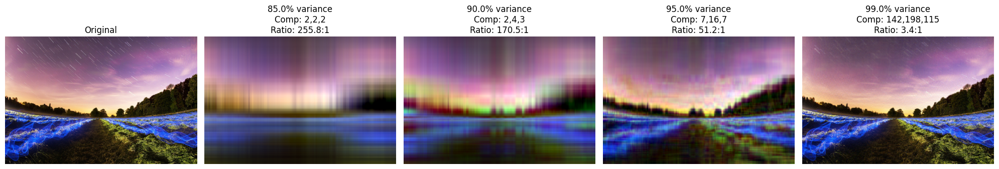


Comparison of different compression levels for Image 2:


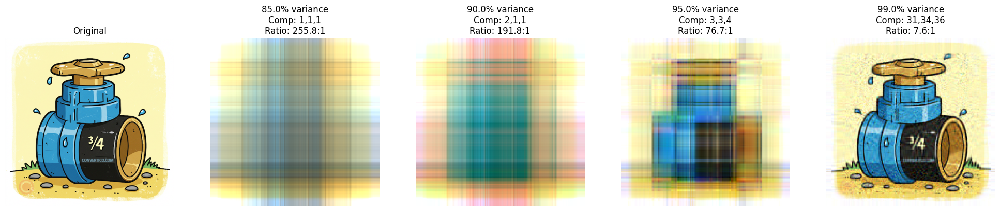

In [ ]:
def compress_image_with_variance_ratio(img, target_variance=0.9):
    
    U_channels, s_channels, Vt_channels = compute_svd_for_image(img)

    compressed_channels = []
    components_used = []

    for i, (U, s, Vt) in enumerate(zip(U_channels, s_channels, Vt_channels)):
        variance = s**2
        total_variance = np.sum(variance)
        explained_variance_ratio = variance / total_variance
        cumulative_variance = np.cumsum(explained_variance_ratio)

        k = np.argmax(cumulative_variance >= target_variance) + 1
        components_used.append(k)

        compressed_channel = np.dot(U[:, :k], np.dot(np.diag(s[:k]), Vt[:k, :]))
        compressed_channels.append(compressed_channel)

    compressed_img = np.stack(compressed_channels, axis=2)

    compressed_img = np.clip(compressed_img, 0, 255).astype(np.uint8)

    return compressed_img, components_used

def display_compression_results(original_img, compressed_img, components_used, target_variance=0.9):
    
    h, w, c = original_img.shape
    original_size = h * w * c

    compressed_size = sum(k * (h + w + 1) for k in components_used)
    compression_ratio = original_size / compressed_size

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(original_img)
    axes[0].set_title(f'Original Image\nSize: {original_img.shape}')
    axes[0].axis('off')

    axes[1].imshow(compressed_img)
    axes[1].set_title(f'Compressed Image ({target_variance*100}% variance)\n'
                     f'Components: R={components_used[0]}, G={components_used[1]}, B={components_used[2]}\n'
                     f'Compression Ratio: {compression_ratio:.2f}:1')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    print(f"Compression Statistics:")
    print(f"Original image size: {h}×{w}×{c} = {original_size:,} values")
    print(f"Components used - R: {components_used[0]}, G: {components_used[1]}, B: {components_used[2]}")
    print(f"Compressed storage: {compressed_size:,} values")
    print(f"Compression ratio: {compression_ratio:.2f}:1")
    print(f"Storage reduction: {(1 - compressed_size/original_size)*100:.1f}%")

print("Compressing Image 1 with 90% variance retention:")
compressed_img1, components1 = compress_image_with_variance_ratio(img1, 0.9)
display_compression_results(img1, compressed_img1, components1, 0.9)

print("\n" + "="*50 + "\n")

print("Compressing Image 2 with 90% variance retention:")
compressed_img2, components2 = compress_image_with_variance_ratio(img2, 0.9)
display_compression_results(img2, compressed_img2, components2, 0.9)

def compare_compression_levels(img, variance_levels=[0.85, 0.90, 0.95, 0.99]):
    """
    Compare compression at different variance retention levels
    """
    fig, axes = plt.subplots(1, len(variance_levels) + 1, figsize=(20, 4))

    axes[0].imshow(img)
    axes[0].set_title('Original')
    axes[0].axis('off')

    for i, variance in enumerate(variance_levels):
        compressed_img, components = compress_image_with_variance_ratio(img, variance)

        h, w, c = img.shape
        original_size = h * w * c
        compressed_size = sum(k * (h + w + 1) for k in components)
        compression_ratio = original_size / compressed_size

        axes[i+1].imshow(compressed_img)
        axes[i+1].set_title(f'{variance*100}% variance\n'
                           f'Comp: {components[0]},{components[1]},{components[2]}\n'
                           f'Ratio: {compression_ratio:.1f}:1')
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

print("\nComparison of different compression levels for Image 1:")
compare_compression_levels(img1)

print("\nComparison of different compression levels for Image 2:")
compare_compression_levels(img2)

# **Problem 3: PCA and its applications** ``(50 pt.)``

---


Principal Component Analysis (PCA) is a statistical technique commonly used in data analysis and machine learning for dimensionality reduction while preserving as much variance as possible. It helps in identifying patterns in data based on the correlation between features. The goal of PCA is to reduce the number of variables of a data set, while preserving as much information (variance) as possible.

---

### Step 1: Standardize the Dataset
Normalize each feature in the dataset to have zero mean and unit variance to ensure each feature contributes equally:

\begin{align}
z_i = \frac{(x_i - \mu)}{\sigma}
\end{align}

### Step 2: Compute the Covariance Matrix
Construct a covariance matrix to analyze how features vary from the mean with respect to each other, which helps in identifying correlated features:

\begin{align}
C = \frac{1}{n-1} \times (X^T X)
\end{align}

where \( X \) is the standardized data matrix.

### Step 3: Calculate Eigenvalues and Eigenvectors
Solve for eigenvalues and their corresponding eigenvectors of the covariance matrix; these will determine the new axes (principal components) for the data projection:

\begin{align}
Cv = \lambda v
\end{align}

### Step 4: Sort Eigenvalues and Eigenvectors
Order the eigenvalues from largest to smallest and rank the eigenvectors accordingly. This ranking indicates the relative significance of each principal component.

### Step 5: Project Data onto Principal Components
Transform the original dataset into a new coordinate system by projecting it onto the principal eigenvectors, reducing dimensionality while retaining most of the variance:

\begin{align}
Y = XW
\end{align}

Here, \( W \) is the matrix containing the selected eigenvectors, and \( Y \) is the transformed data matrix. This final transformation results in a new dataset that highlights the most significant relationships within the original data.

---
In the section below, import all the libraries you need:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import time
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from keras.datasets import mnist
import warnings
warnings.filterwarnings('ignore')

print("✅ All libraries imported successfully!")

✅ All libraries imported successfully!


The MNIST dataset is a large collection of handwritten digits commonly used for training various image processing systems. It contains 70,000 images of handwritten digits from 0 to 9, each represented as a 28x28 pixel grayscale image.

load the dataset and show the first 50 samples:

In [ ]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()

print(f"Training data shape: {x_train.shape}")
print(f"Training labels shape: {y_train.shape}")
print(f"Test data shape: {x_test.shape}")
print(f"Test labels shape: {y_test.shape}")

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Training data shape: (60000, 28, 28)
Training labels shape: (60000,)
Test data shape: (10000, 28, 28)
Test labels shape: (10000,)


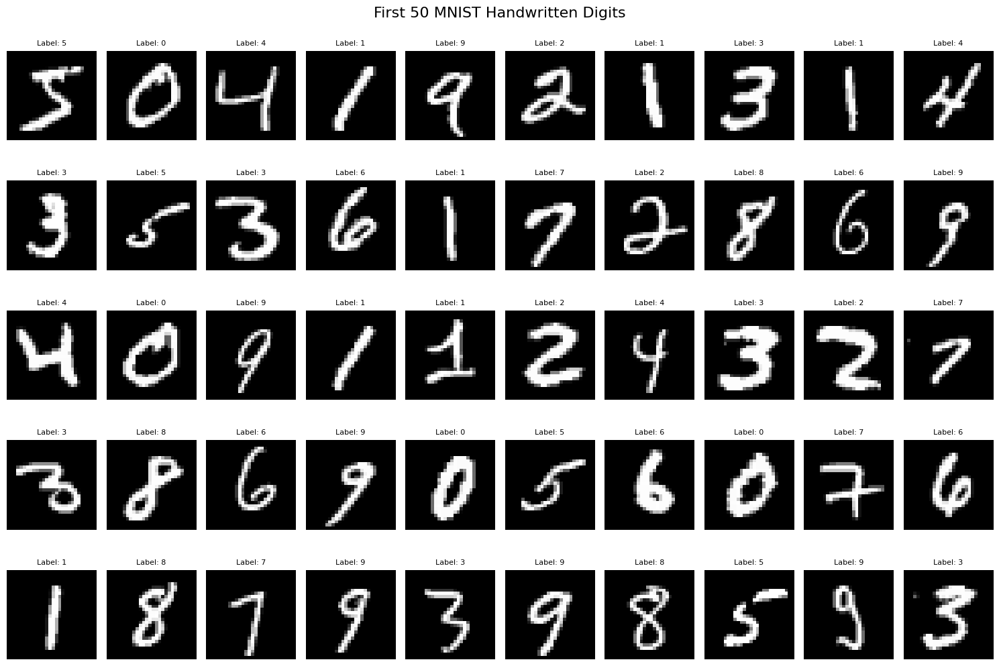

In [ ]:
plt.figure(figsize=(15, 10))
for i in range(50):
    plt.subplot(5, 10, i + 1)
    plt.imshow(x_train[i], cmap='gray')
    plt.title(f'Label: {y_train[i]}', fontsize=8)
    plt.axis('off')
plt.tight_layout()
plt.suptitle('First 50 MNIST Handwritten Digits', y=1.02, fontsize=16)
plt.show()

PCA is affected by scale, so you need to do some normalization on data before applying PCA.

1- Reshape the data from a 28x28 matrix to a flattened 784-element vector.

2- Subtract the mean and divide by the standard deviation for each sample.


In [ ]:
x_train_flattened = x_train.reshape(x_train.shape[0], -1)
scaler = StandardScaler()
x_train_normalized = scaler.fit_transform(x_train_flattened)

n_samples = x_train_normalized.shape[0]
covariance_matrix = np.cov(x_train_normalized.T)

print(f"Covariance matrix shape: {covariance_matrix.shape}")

eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues_sorted = eigenvalues[sorted_indices]
eigenvectors_sorted = eigenvectors[:, sorted_indices]

print(f"Number of eigenvalues: {len(eigenvalues_sorted)}")
print(f"Largest eigenvalue: {eigenvalues_sorted[0]:.2f}")
print(f"Smallest eigenvalue: {eigenvalues_sorted[-1]:.2f}")

Covariance matrix shape: (784, 784)
Number of eigenvalues: 784
Largest eigenvalue: 40.49
Smallest eigenvalue: -0.00


In this section, first obtain the covariance matrix of the data and then extract its eigenvalues and eigenvectors. Finally, sort the eigenvalues and their corresponding eigenvectors from largest to smallest.

Number of components needed for 75% variance: 120
Actual variance explained: 0.7502


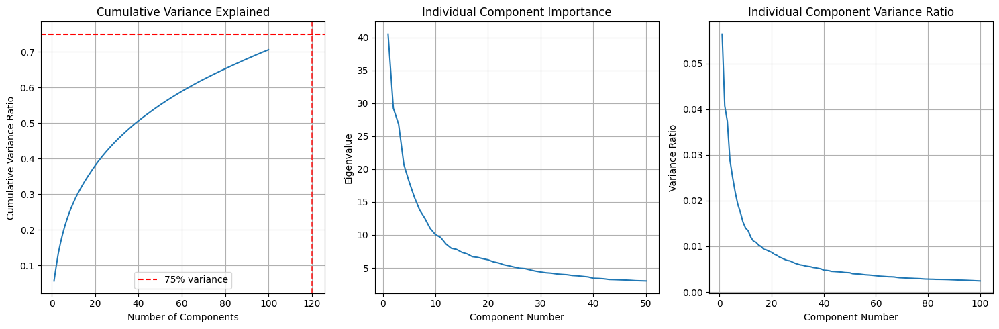

In [ ]:
total_variance = np.sum(eigenvalues_sorted)
cumulative_variance_ratio = np.cumsum(eigenvalues_sorted) / total_variance

target_variance = 0.75
n_components_75 = np.argmax(cumulative_variance_ratio >= target_variance) + 1

print(f"Number of components needed for 75% variance: {n_components_75}")
print(f"Actual variance explained: {cumulative_variance_ratio[n_components_75-1]:.4f}")

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(range(1, min(101, len(eigenvalues_sorted)+1)),
         cumulative_variance_ratio[:min(100, len(eigenvalues_sorted))])
plt.axhline(y=0.75, color='r', linestyle='--', label='75% variance')
plt.axvline(x=n_components_75, color='r', linestyle='--', alpha=0.7)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Ratio')
plt.title('Cumulative Variance Explained')
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(range(1, min(51, len(eigenvalues_sorted)+1)),
         eigenvalues_sorted[:min(50, len(eigenvalues_sorted))])
plt.xlabel('Component Number')
plt.ylabel('Eigenvalue')
plt.title('Individual Component Importance')
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(range(1, min(101, len(eigenvalues_sorted)+1)),
         eigenvalues_sorted[:min(100, len(eigenvalues_sorted))] / np.sum(eigenvalues_sorted))
plt.xlabel('Component Number')
plt.ylabel('Variance Ratio')
plt.title('Individual Component Variance Ratio')
plt.grid(True)

plt.tight_layout()
plt.show()

Now, we want to examine how many components can represent 75 percent of the total variance of the data. Note that the variance of each component corresponds to its eigenvalue.

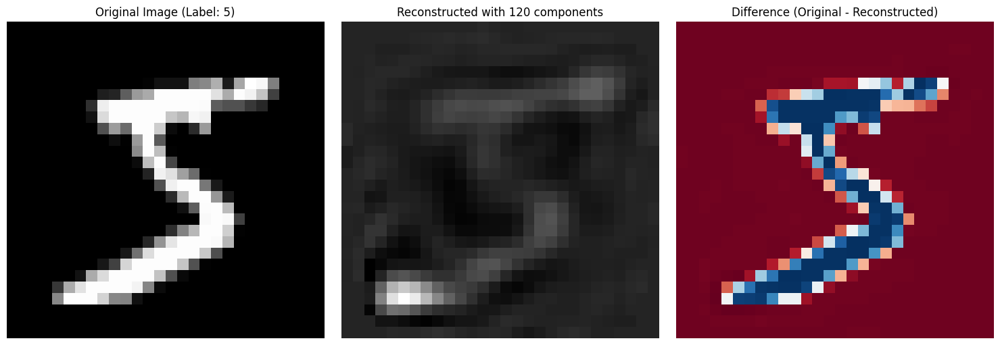

Original image min/max: 0.00/255.00
Reconstructed image min/max: -1.49/8.69


In [ ]:
n_components = n_components_75
principal_components = eigenvectors_sorted[:, :n_components]

x_train_pca = np.dot(x_train_normalized, principal_components)

x_train_reconstructed = np.dot(x_train_pca, principal_components.T)

sample_idx = 0
original_image = x_train[sample_idx]
reconstructed_image = x_train_reconstructed[sample_idx].reshape(28, 28)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(original_image, cmap='gray')
plt.title(f'Original Image (Label: {y_train[sample_idx]})')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(reconstructed_image, cmap='gray')
plt.title(f'Reconstructed with {n_components} components')
plt.axis('off')

plt.subplot(1, 3, 3)
difference = original_image.astype(float) - reconstructed_image
plt.imshow(difference, cmap='RdBu')
plt.title('Difference (Original - Reconstructed)')
plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Original image min/max: {original_image.min():.2f}/{original_image.max():.2f}")
print(f"Reconstructed image min/max: {reconstructed_image.min():.2f}/{reconstructed_image.max():.2f}")

Now in this section, project the available data onto these components, perform dimensionality reduction, and then return the dimensions to the size of the original images. Draw an image of one of the samples for both states: before dimension reduction on the components and after it.

In [ ]:
def do_pca(n_components, data):
    if n_components > eigenvectors_sorted.shape[1]:
        n_components = eigenvectors_sorted.shape[1]

    principal_components = eigenvectors_sorted[:, :n_components]
    projected_data = np.dot(data, principal_components)

    return projected_data, principal_components

In this section, define a classifier such as SVM or RandomForest, and use the test and training data to determine the accuracy of the classifier. Repeat this process for different numbers of components and examine the impact of increasing the number of components on accuracy. Note that in this section, you can use built-in functions for performing PCA and classification. Additionally, identify which number of components results in the best accuracy.

In [ ]:
def do_pca(n_components, data):
    
    if n_components > eigenvectors_sorted.shape[1]:
        n_components = eigenvectors_sorted.shape[1]

    principal_components = eigenvectors_sorted[:, :n_components]
    projected_data = np.dot(data, principal_components)

    return projected_data, principal_components

In [ ]:
def ML_model(X, y, print_output=True):
    
    n_samples = min(10000, X.shape[0])
    indices = np.random.choice(X.shape[0], n_samples, replace=False)
    X_subset = X[indices]
    y_subset = y[indices]

    split_idx = int(0.8 * n_samples)
    X_train_ml = X_subset[:split_idx]
    X_test_ml = X_subset[split_idx:]
    y_train_ml = y_subset[:split_idx]
    y_test_ml = y_subset[split_idx:]

    clf = SVC(kernel='rbf', random_state=42, C=1.0)
    start_time = time.time()
    clf.fit(X_train_ml, y_train_ml)
    train_time = time.time() - start_time

    y_pred = clf.predict(X_test_ml)
    accuracy = accuracy_score(y_test_ml, y_pred)

    if print_output:
        print(f"Accuracy: {accuracy:.4f}, Training time: {train_time:.2f}s")

    return accuracy

Testing different numbers of components...


  5%|▌         | 1/20 [00:05<01:50,  5.84s/it]

Components: 2, Accuracy: 0.3680


 25%|██▌       | 5/20 [00:13<00:31,  2.12s/it]

Components: 22, Accuracy: 0.9380


 45%|████▌     | 9/20 [00:21<00:25,  2.30s/it]

Components: 42, Accuracy: 0.9345


 65%|██████▌   | 13/20 [00:32<00:18,  2.65s/it]

Components: 62, Accuracy: 0.9490


 85%|████████▌ | 17/20 [00:45<00:09,  3.03s/it]

Components: 82, Accuracy: 0.9515


100%|██████████| 20/20 [00:57<00:00,  2.89s/it]


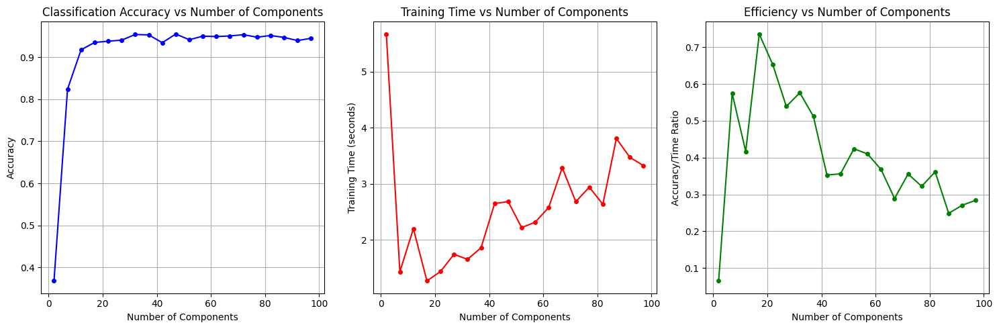


Best performance:
Number of components: 47
Accuracy: 0.9550
Variance explained with 47 components: 0.5382

Summary of results:
Components   Accuracy   Time (s)   Variance %  
--------------------------------------------------
2            0.3680     5.67       9.72        
22           0.9380     1.44       39.70       
42           0.9345     2.65       51.59       
62           0.9490     2.58       59.64       
82           0.9515     2.63       65.82       


In [ ]:

component_range = range(2, 102, 5)  
accuracies = []
times = []

print("Testing different numbers of components...")
for n_comp in tqdm(component_range):
    X_pca, _ = do_pca(n_comp, x_train_normalized)

    start_time = time.time()
    accuracy = ML_model(X_pca, y_train, print_output=False)
    end_time = time.time()

    accuracies.append(accuracy)
    times.append(end_time - start_time)

    if n_comp % 20 == 2:  
        print(f"Components: {n_comp}, Accuracy: {accuracy:.4f}")

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(component_range, accuracies, 'b-o', markersize=4)
plt.xlabel('Number of Components')
plt.ylabel('Accuracy')
plt.title('Classification Accuracy vs Number of Components')
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(component_range, times, 'r-o', markersize=4)
plt.xlabel('Number of Components')
plt.ylabel('Training Time (seconds)')
plt.title('Training Time vs Number of Components')
plt.grid(True)

plt.subplot(1, 3, 3)
efficiency = np.array(accuracies) / np.array(times)
plt.plot(component_range, efficiency, 'g-o', markersize=4)
plt.xlabel('Number of Components')
plt.ylabel('Accuracy/Time Ratio')
plt.title('Efficiency vs Number of Components')
plt.grid(True)

plt.tight_layout()
plt.show()

best_idx = np.argmax(accuracies)
best_components = component_range[best_idx]
best_accuracy = accuracies[best_idx]

print(f"\nBest performance:")
print(f"Number of components: {best_components}")
print(f"Accuracy: {best_accuracy:.4f}")
print(f"Variance explained with {best_components} components: {cumulative_variance_ratio[best_components-1]:.4f}")

print(f"\nSummary of results:")
print(f"{'Components':<12} {'Accuracy':<10} {'Time (s)':<10} {'Variance %':<12}")
print("-" * 50)
for i, n_comp in enumerate(component_range[::4]):  
    idx = list(component_range).index(n_comp)
    variance_pct = cumulative_variance_ratio[n_comp-1] * 100
    print(f"{n_comp:<12} {accuracies[idx]:<10.4f} {times[idx]:<10.2f} {variance_pct:<12.2f}")